In [1]:
%load_ext autoreload
%autoreload 2
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import sys
import json
from efficientnet_pytorch import EfficientNet
from torchvision import transforms

# Custom imports
sys.path.insert(0, "../")
from utils import grid_plot, fix_seed

from utils import class_sampler, grid_plot
import schedulers
from schedulers import *
from constraints import *
from objectives import *
from distances import *
from methods import *
from projections import *
from models.pretrained import EfficientNetClassifier, ImagenetBigBiGAN

z_all = np.load(r"C:\Users\cerma\projects\generate-ae\experiments\input_images\encoded\encoded_z_0.npy")
z_all = torch.tensor(z_all)

z_broccoli = np.load(r"C:\Users\cerma\projects\generate-ae\experiments\input_images\broccoli\encoded\encoded_z_0.npy")
z_broccoli = torch.tensor(z_broccoli)

labels_map = json.load(open('labels_map.txt'))

In [3]:
target_classes = {
    937: "broccoli",
    555: "fire truck",
    35:  "mud turtle"
}

Loaded pretrained weights for efficientnet-b0


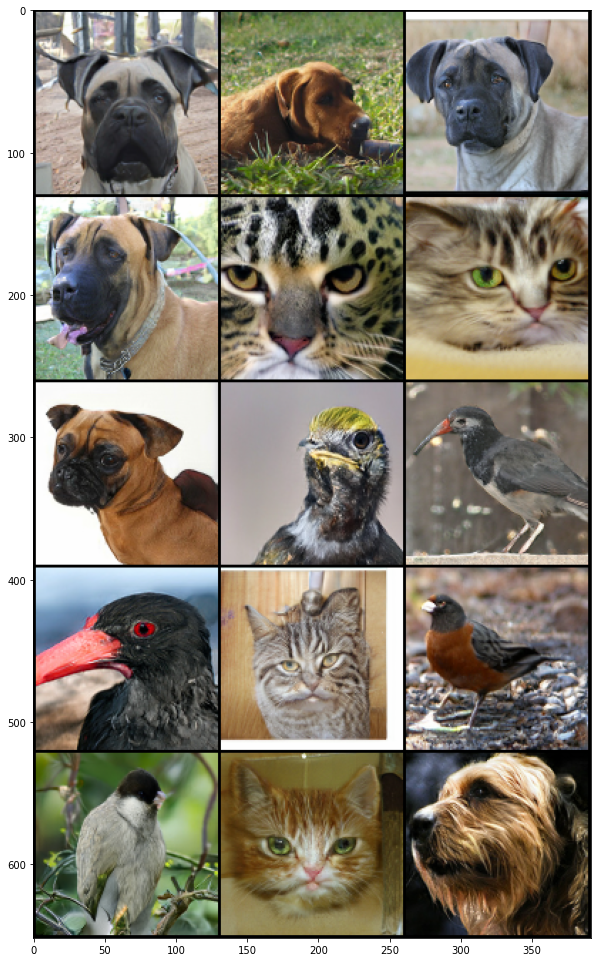

['bull mastiff',
 'redbone',
 'bull mastiff',
 'bull mastiff',
 'leopard, Panthera pardus',
 'tabby, tabby cat',
 'Brabancon griffon',
 'brambling, Fringilla montifringilla',
 'junco, snowbird',
 'hornbill',
 'tabby, tabby cat',
 'robin, American robin, Turdus migratorius',
 'bulbul',
 'tabby, tabby cat',
 'otterhound, otter hound']

In [5]:
classifier = EfficientNetClassifier('cpu')
bgan = ImagenetBigBiGAN(1, 'cpu')

x = bgan(z_all)
grid_plot(x, nrows=3, figsize=(10, 100))

output = classifier(x)
classes = output.argmax(1)

[labels_map[str(i.item())] for i in classes]

## Targeted Attack

In [95]:
from methods import calculate_batch
@calculate_batch(variables=2)
def penalty_method_targeted(x0, target_y, distance, model, xi, rho, grad_norm='l2', iters=100, max_unchanged=10):
    '''
    Penalty method with distance as objective and misclassification constraint. 
    Penalty function: max(g(x), 0)^2
    '''
    constraint = ConstraintMisclassify(x0, model)
    constraint = ConstraintClassifyTarget(target_y, model)
    result = torch.full_like(x0, float('nan'))

    x = x0.clone()
    unchanged = 0
    for t in range(iters):
        # Optimization step
        l = lambda x: distance(x0, x) + rho(t)*F.relu(constraint(x))**2
        grad = calculate_gradients(l, x, norm=grad_norm)
        x = x - xi(t)*grad

        # Termination condition
        if torch.sign(constraint(x)) > 0:
            unchanged += 1
        else:
            unchanged = 0
            result = x
        if unchanged > max_unchanged:
            break
    return result.detach()

class ConstraintClassifyTarget(Constraint):

    def __init__(self, y, model, softmax=True):
        super().__init__()
        self.margin = Margin()
        self.y = y
        self.model = model
        self.softmax = softmax

    def forward(self, x, subset=None):
        if subset is not None:
            y = self.y[subset]
        else:
            y = self.y

        if x.shape[0] != y.shape[0]:
            raise ValueError('x and subset of x0 have different batch size.')

        prediction = self.model(x)
        # TODO there should be a check that prediction has at most two dimensions
        if self.softmax:
            prediction = F.softmax(prediction, 1)
        return self.margin(prediction, y)


In [104]:
z0 = z_all[:1]
gp_generator = ImagenetBigBiGAN(2, 'cpu')
classifier = EfficientNetClassifier('cpu')
gp_combined = lambda z: classifier(gp_generator.decode(z))

v0 = gp_generator.encode(z0)

rho = SchedulerStep(10e10, gamma=1, n=10)
xi = SchedulerExponential(initial=1, gamma=0.01)
distance = L2(Decoded(gp_generator))

target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)

Loaded pretrained weights for efficientnet-b0


In [105]:
%%time
v_per = penalty_method_targeted(v0, target_labels, distance, gp_combined, xi, rho, grad_norm='l2',
                                iters=1000, max_unchanged=100)

Wall time: 11min 56s


['broccoli']


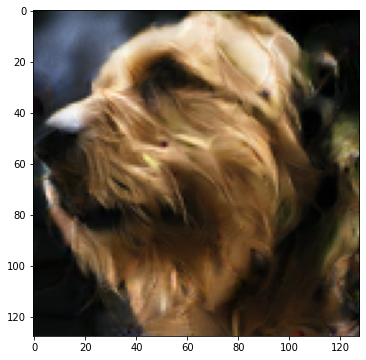

In [146]:
x = gp_generator.decode(v_per)
classes = classifier(x).argmax(1)

print([labels_map[str(i.item())] for i in classes])
grid_plot(x)

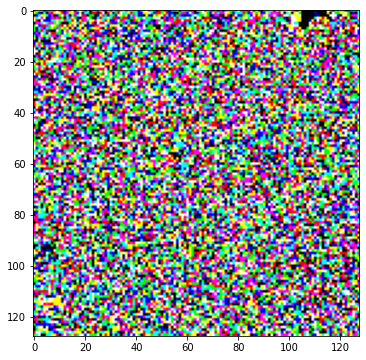

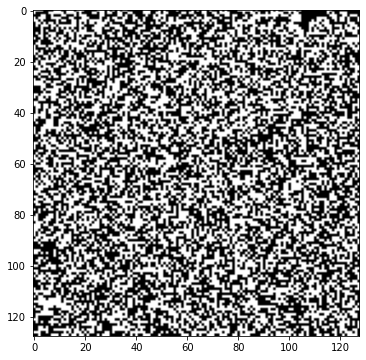

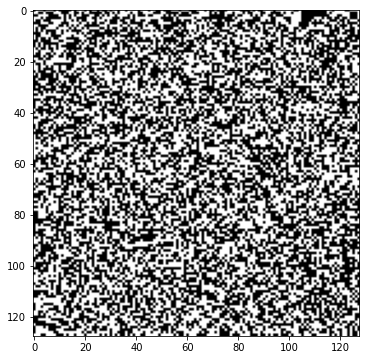

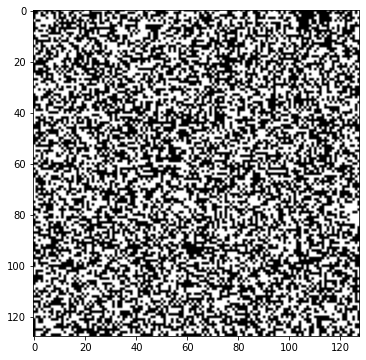

In [122]:
lsb = least_significant_bits(x)

grid_plot(lsb)
lsb.mean(dim=(2, 3))

x1 = lsb[:, 0, :, :].unsqueeze(1)
x2 = lsb[:, 1, :, :].unsqueeze(1)
x3 = lsb[:, 2, :, :].unsqueeze(1)

grid_plot(x1)
grid_plot(x2)
grid_plot(x3)

['otterhound, otter hound']


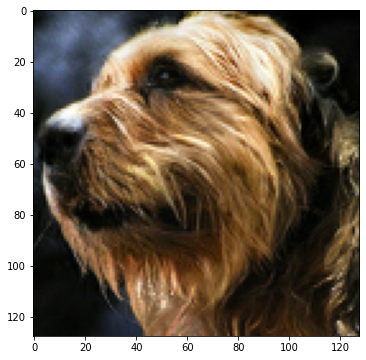

In [123]:
x0 = gp_generator.decode(v0)
classes = classifier(x0).argmax(1)
print([labels_map[str(i.item())] for i in classes])
grid_plot(x0)

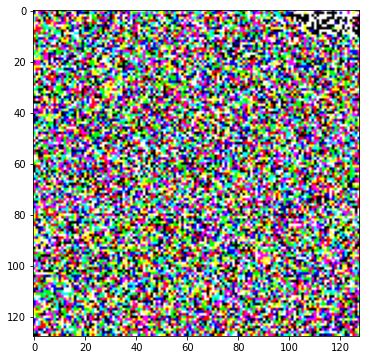

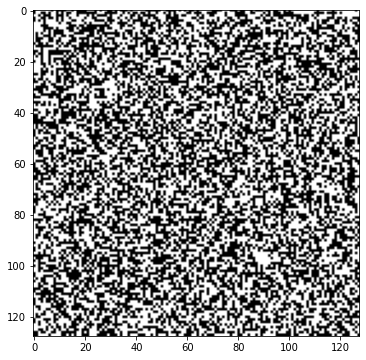

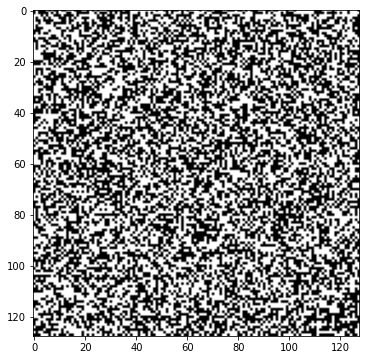

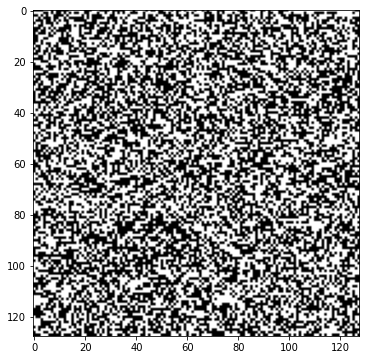

In [124]:
lsb = least_significant_bits(x0)

grid_plot(lsb)
lsb.mean(dim=(2, 3))

x1 = lsb[:, 0, :, :].unsqueeze(1)
x2 = lsb[:, 1, :, :].unsqueeze(1)
x3 = lsb[:, 2, :, :].unsqueeze(1)

grid_plot(x1)
grid_plot(x2)
grid_plot(x3)

In [20]:
def least_significant_bits(sample):
    sample_int = (sample*255).type(torch.uint8)
    lsb = torch.remainder(sample_int, 2).type(torch.float)
    return lsb


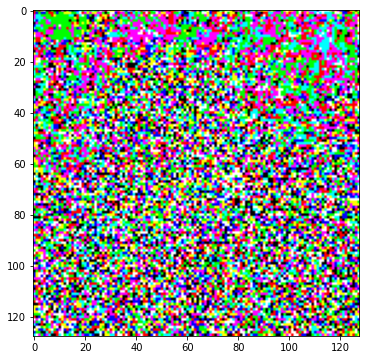

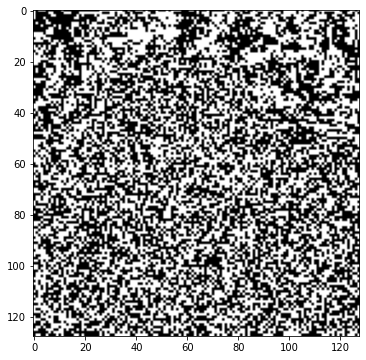

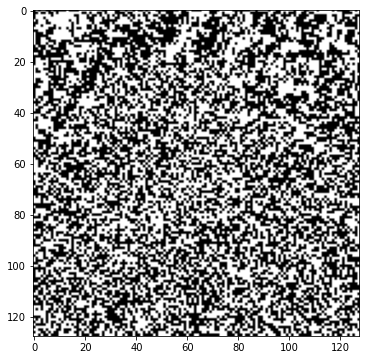

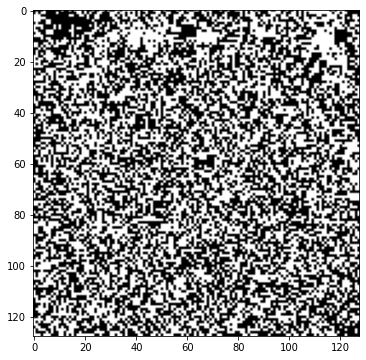

In [33]:
lsb = least_significant_bits(x[0].unsqueeze(0))
grid_plot(lsb)

x1 = lsb[:, 0, :, :].unsqueeze(1)
x2 = lsb[:, 1, :, :].unsqueeze(1)
x3 = lsb[:, 2, :, :].unsqueeze(1)

grid_plot(x1)
grid_plot(x2)
grid_plot(x3)

### Difference

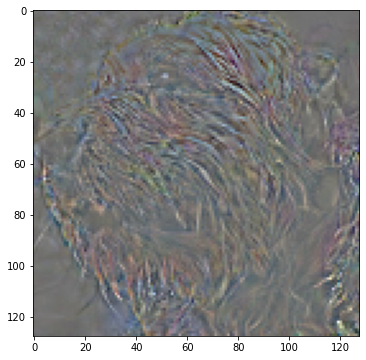

In [145]:
dif = (x0 - x)
grid_plot(dif)

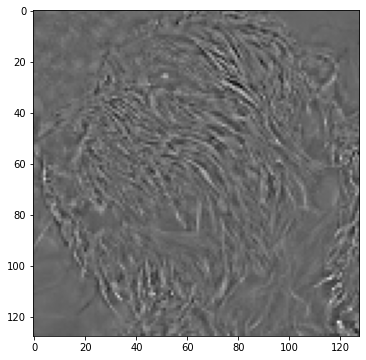

In [132]:
dif = (x0 - x).sum(1)
grid_plot(dif)

### Absolute difference

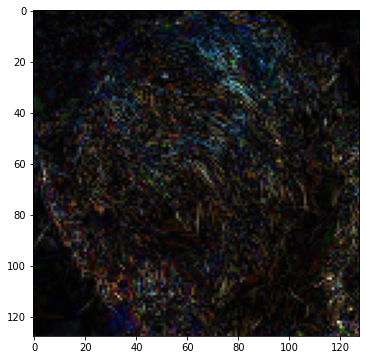

In [127]:
dif = (x0 - x).abs()
grid_plot(dif)

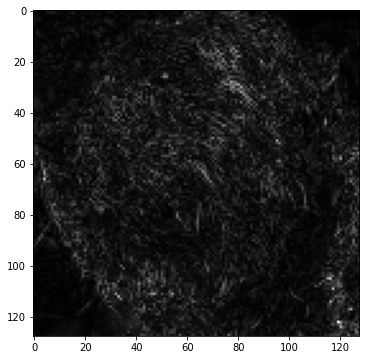

In [133]:
dif = (x0 - x).abs().sum(1)
grid_plot(dif)

In [ ]:
# cats: n02123045

# Multiple images

In [80]:
classifier = EfficientNetClassifier('cpu')
bgan = ImagenetBigBiGAN(1, 'cpu')


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import sys
import json
from efficientnet_pytorch import EfficientNet

from torchvision import transforms

# Custom imports
sys.path.insert(0, "../")
from utils import grid_plot, fix_seed

from utils import class_sampler, grid_plot
import schedulers
from schedulers import *
from constraints import *
from objectives import *
from distances import *
from methods import *
from projections import *
from models.pretrained import EfficientNetClassifier, ImagenetBigBiGAN

z_all = np.load(r"C:\Users\cerma\projects\generate-ae\experiments\input_images\encoded\encoded_z_0.npy")
z_all = torch.tensor(z_all)


In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
import json
import sys
sys.path.insert(0, "../")
from utils import fix_seed
from models import pretrained
import methods

classifiers = {
    'imagenet-effnet': pretrained.EfficientNetClassifier
}

generators = {
    'imagenet-bigbigan' :  pretrained.ImagenetBigBiGAN,
}

attacks = {
    'penalty_pop': methods.PenaltyPopMethod,
    'penalty':     methods.PenaltyMethod,
    'projection':  methods.ProjectionMethod,
}

experiments = [
    {
        "classifier": "imagenet-effnet",
        "generator":  "imagenet-bigbigan",
        "generator_level": 2,
        "method": "penalty_pop",
        "targets": [937, 950, 555]
        "params": {
            "distance": "l2",
            "constraint": "targeted",
            "rho": {"scheduler": "SchedulerStep", "params": {"initial": 10e10, "gamma": 1, "n":10}},
            "xi": {"scheduler": "SchedulerExponential", "params": {"initial": 0.5, "gamma": 0.01}},
            "grad_norm": 'l2',
            "iters": 1500,
            "max_unchanged": 100
        }
    },
]
z_samples = np.load(r"C:\Users\cerma\projects\generate-ae\experiments\input_images\encoded\encoded_z_0.npy")
targets = [937, 950]

In [2]:
class Test():
    pass

args = Test()
args.device  = 'cuda'

experiment = experiments[0]
target = targets[0]


In [8]:
for z in z_samples_sub:
    pass

In [4]:
z_samples_sub = z_samples[:1]
z0 = torch.tensor(z_samples_sub).to(args.device)
v0 = generator.encode(z0)
target_labels = torch.tensor(np.repeat(target, v0.shape[0]), dtype=torch.int64, device=args.device)

In [12]:
z_samples_sub = z_samples[:2]

In [47]:
for i, experiment in enumerate(experiments):
    generator = generators[experiment['generator']](experiment['generator_level'], args.device)
    classifier = classifiers[experiment['classifier']](args.device)
    method = attacks[experiment['method']](**experiment['params'])
    combined = lambda z: classifier(generator.decode(z))

    results = {}
    for target in targets:
        target_labels = torch.tensor([target], dtype=torch.int64, device=args.device)

        perturbed = []
        for sample in z_samples_sub:
            z0 = torch.tensor(sample).to(args.device).unsqueeze(0)
            v0 = generator.encode(z0)
            v_per = method(x0=v0, x_init=None, classifier=combined, generator=generator, target=target_labels)
            perturbed.append(generator.decode(v_per))
        results[target] = torch.cat(perturbe).cpu().detach().numpy()

    data = {
        'script': vars(args),
        'params': method.params_all,
        'json':   experiment,
        'x_per':  results,
    }

Loaded pretrained weights for efficientnet-b0
done
done
done
done


In [53]:
xx = torch.cat([torch.tensor(data['x_per'][937]), torch.tensor(data['x_per'][950])])

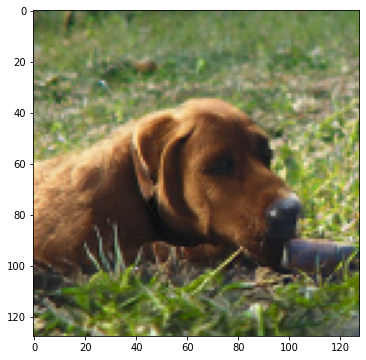

In [62]:
grid_plot(torch.tensor(data['x0']))

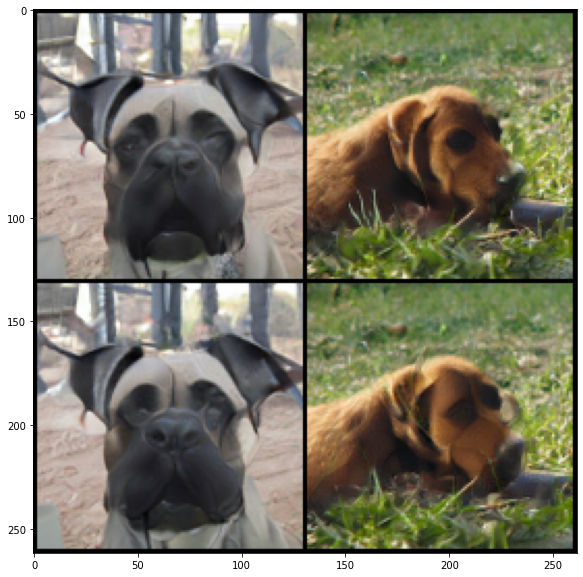

In [57]:
grid_plot(xx, nrows=2, figsize=(10, 10))

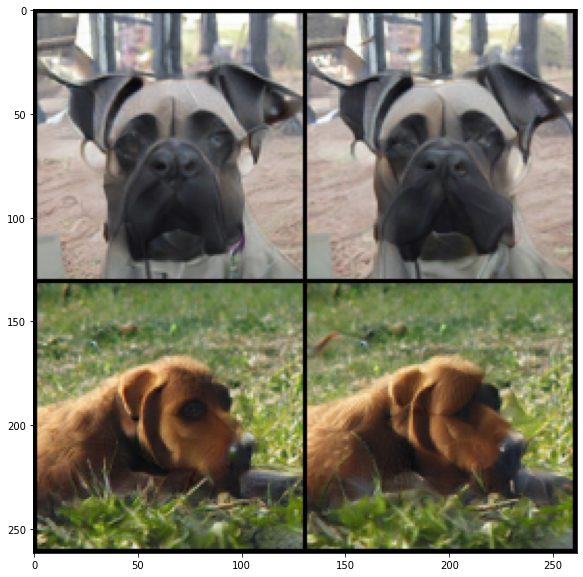

In [28]:
from utils import grid_plot
grid_plot(x_per, nrows=2, figsize=(10, 10))

In [51]:
x0 = generator.decode(v0)

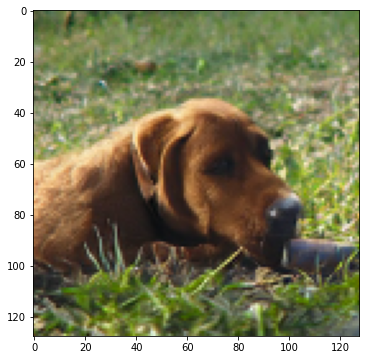

In [54]:
grid_plot(x0)

tensor([937], device='cuda:0')


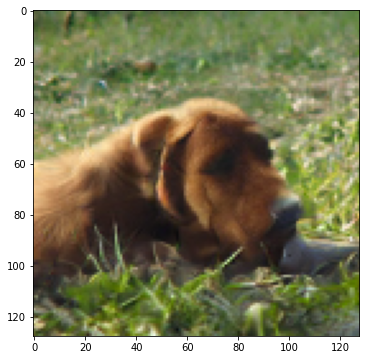

In [50]:
from utils import grid_plot
x = generator.decode(v_per)
classes = classifier(x).argmax(1)

print(classes)
grid_plot(x)


In [29]:
diff = (x0 - x_per)

NameError: name 'x' is not defined

In [30]:
grid_plot(diff)

NameError: name 'diff' is not defined

In [19]:
from methods import PenaltyPopMethod

In [87]:
%%time
fix_seed(1)


penm = PenaltyPopMethod(**params)

#device = 'cpu'
device = 'cuda'

z0 = z_all[:1]
z0 = z0.to(device)
generator = ImagenetBigBiGAN(2, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(gp_generator.decode(z))

v0 = gp_generator.encode(z0)
target_labels = torch.tensor([555], dtype=torch.int64, device=v0.device)

v_per = penm(v0, combined, generator, target=target_labels)

Loaded pretrained weights for efficientnet-b0
Wall time: 1min 3s


['fire engine, fire truck']


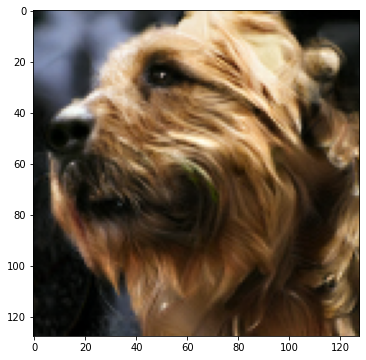

In [88]:
x = gp_generator.decode(v_per)
classes = classifier(x).argmax(1)

print([labels_map[str(i.item())] for i in classes])
grid_plot(x)


['lemon']


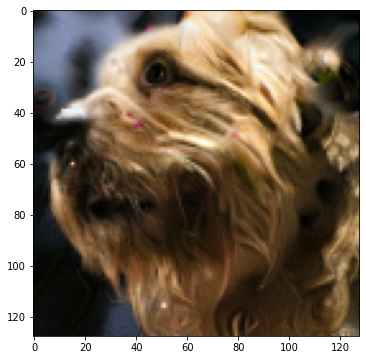

In [86]:
x = gp_generator.decode(v_per)
classes = classifier(x).argmax(1)

print([labels_map[str(i.item())] for i in classes])
grid_plot(x)


['orange']


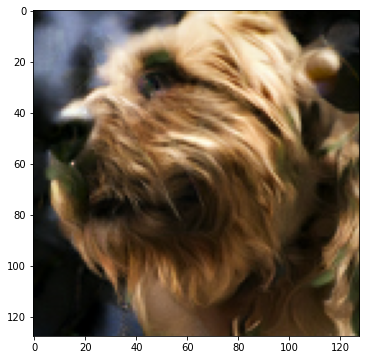

In [84]:
x = gp_generator.decode(v_per)
classes = classifier(x).argmax(1)

print([labels_map[str(i.item())] for i in classes])
grid_plot(x)


In [ ]:
x0 = gp_generator.decode(v0)

tensor([[-0.5394, -0.6924, -0.7749, -0.0852,  0.8371,  0.9596, -1.8219, -0.4339,
         -0.6103, -1.3605,  0.7512,  0.7355, -0.8347,  0.9106,  0.5570, -0.5958,
          0.0308, -0.6130,  0.4617, -0.2445, -0.0464,  0.9957,  0.2953, -0.6640,
          0.6700,  1.1484,  0.6421,  0.3216, -0.0337,  1.9092, -0.1835, -1.4176,
         -2.2533, -0.0264, -0.3247,  1.8114, -0.1964, -0.2616, -0.1123, -0.1339,
          2.0979, -0.9228, -1.4789,  0.0873, -0.6825, -2.1951, -0.5441,  0.9920,
          0.7631,  1.0527, -1.6564,  1.0288, -0.6924,  0.3873, -0.4049,  0.6730,
          0.6507, -0.9740, -0.7033,  2.4406,  0.0094, -1.1847,  1.0692,  0.3040,
          0.8484,  0.1902, -0.1600,  0.5640, -1.1101, -0.3980,  1.1587,  0.4850,
          0.1984,  1.4219, -0.8941,  0.9944, -1.3410, -0.4390, -0.6715,  1.9527,
         -1.1318, -0.1550, -0.8905, -0.8648,  2.5722,  1.0317, -0.9173,  0.4864,
          0.1319,  1.1260,  1.1236, -0.4405, -0.7638, -1.4914,  0.2384, -1.1881,
          2.2564, -0.5971, -

# Projection method

In [ ]:
classifier = EfficientNetClassifier('cpu')
bgan = ImagenetBigBiGAN(1, 'cpu')

x = bgan(z_all)
grid_plot(x, nrows=3, figsize=(10, 100))

output = classifier(x)
classes = output.argmax(1)

[labels_map[str(i.item())] for i in classes]

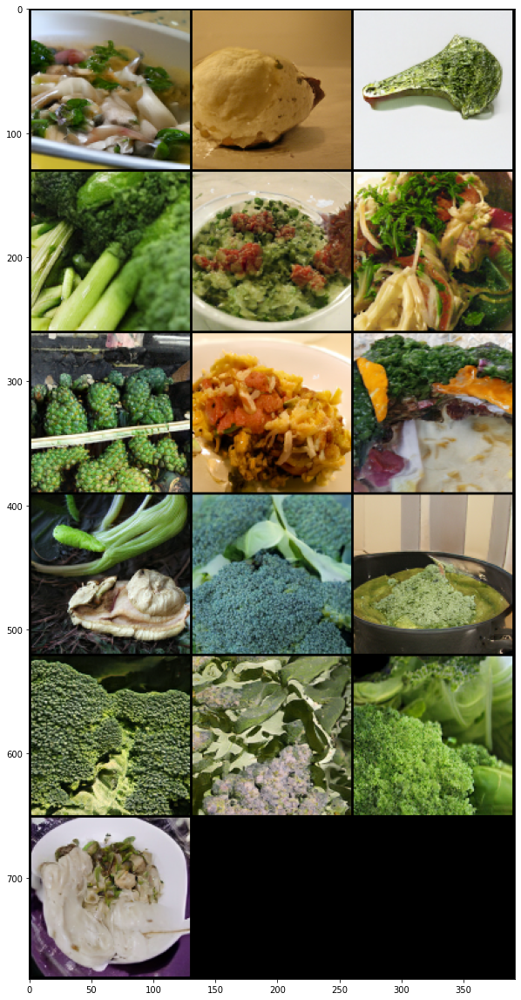

In [15]:
x = bgan(z_broccoli)
grid_plot(x, nrows=3, figsize=(10, 100))

In [19]:
classifier(x).argmax(1)

tensor([925, 961, 937, 937, 924, 959, 956, 940, 935, 996, 937, 924, 937, 937,
        937, 923])

Loaded pretrained weights for efficientnet-b0


C:\Users\cerma\anaconda3\envs\ml\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


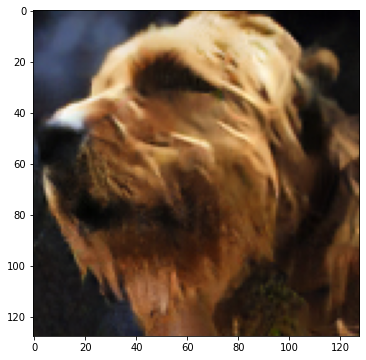

Wall time: 41.1 s


In [2]:
%%time
fix_seed(1)

params = {
    "distance": "l2",
    "constraint": "targeted",
    "xi_c": {'scheduler': 'SchedulerPower', 'params': {'initial': 1, 'power': -0.5}},
    "xi_o": {'scheduler': 'SchedulerConstant', 'params': {'alpha': 1}},
    "grad_norm_c": 'l2',
    "grad_norm_o": 'l2',
    'threshold': 0.01,
    "iters": 150,
}
method = ProjectionMethod(**params)


device = 'cuda'

z0 = z_all[[-1]].to(device)
z_init = z_broccoli[[[-2]]].to(device)

generator = ImagenetBigBiGAN(2, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(generator.decode(z))

v0 = generator.encode(z0)
v_init = generator.encode(z_init)
target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)
v_per = method(x0=v0, x_init=v_init, classifier=combined, generator=generator, target=target_labels)


grid_plot(generator.decode(v_per))

Loaded pretrained weights for efficientnet-b0


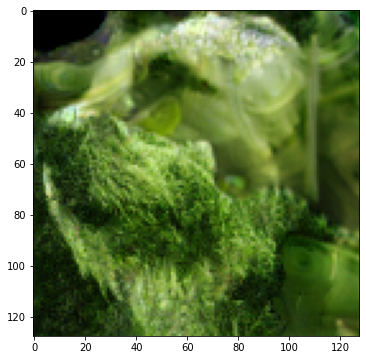

Wall time: 11.9 s


In [3]:
%%time
fix_seed(1)

params = {
    "distance": "l2",
    "constraint": "targeted",
    "xi_c": {'scheduler': 'SchedulerPower', 'params': {'initial': 1, 'power': -0.5}},
    "xi_o": {'scheduler': 'SchedulerConstant', 'params': {'alpha': 1}},
    "grad_norm_c": 'l2',
    "grad_norm_o": 'l2',
    'threshold': 0.01,
    "iters": 75,
}
method = ProjectionMethod(**params)

device = 'cuda'

z0 = z_all[[-1]].to(device)
z_init = z_broccoli[[[-2]]].to(device)

generator = ImagenetBigBiGAN(4, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(generator.decode(z))

v0 = generator.encode(z0)
v_init = generator.encode(z_init)
target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)
v_per = method(x0=v0, x_init=v_init, classifier=combined, generator=generator, target=target_labels)

grid_plot(generator.decode(v_per))

Loaded pretrained weights for efficientnet-b0


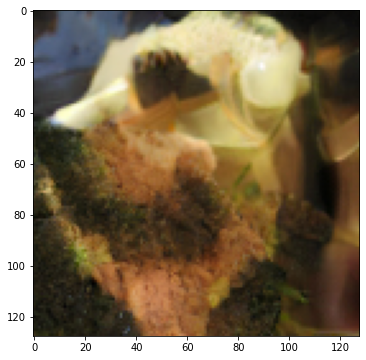

Wall time: 4.42 s


In [4]:
%%time
fix_seed(1)

params = {
    "distance": "l2",
    "constraint": "targeted",
    "xi_c": {'scheduler': 'SchedulerPower', 'params': {'initial': 1, 'power': -0.5}},
    "xi_o": {'scheduler': 'SchedulerConstant', 'params': {'alpha': 1}},
    "grad_norm_c": 'l2',
    "grad_norm_o": 'l2',
    'threshold': 0.01,
    "iters": 15,
}
method = ProjectionMethod(**params)

device = 'cuda'

z0 = z_all[[-1]].to(device)
z_init = z_broccoli[[[-2]]].to(device)

generator = ImagenetBigBiGAN(2, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(generator.decode(z))

v0 = generator.encode(z0)
v_init = generator.encode(z_init)
target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)
v_per = method(x0=v0, x_init=v_init, classifier=combined, generator=generator, target=target_labels)

grid_plot(generator.decode(v_per))

## Projection method Failure

Loaded pretrained weights for efficientnet-b0


C:\Users\cerma\anaconda3\envs\ml\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Binary search has wrong initializaion
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans
All nans


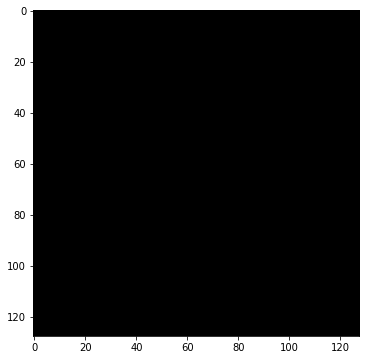

Wall time: 52.4 s


In [2]:
%%time
fix_seed(1)

params = {
    "distance": "l2",
    "constraint": "targeted",
    "xi_c": {'scheduler': 'SchedulerPower', 'params': {'initial': 1, 'power': -0.5}},
    "xi_o": {'scheduler': 'SchedulerConstant', 'params': {'alpha': 1}},
    "grad_norm_c": 'l2',
    "grad_norm_o": 'l2',
    'threshold': 0.01,
    "iters": 150,
}
method = ProjectionMethod(**params)

device = 'cuda'

z0 = z_all[[-1]].to(device)
z_init = z_broccoli[[[-2]]].to(device)

generator = ImagenetBigBiGAN(0, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(generator.decode(z))

v0 = generator.encode(z0)
v_init = generator.encode(z_init)
target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)
v_per = method(x0=v0, x_init=v_init, classifier=combined, generator=generator, target=target_labels)

grid_plot(generator.decode(v_per))

Loaded pretrained weights for efficientnet-b0
Invalid step... correcting
Invalid step... correcting
Invalid step... correcting
Invalid step... correcting


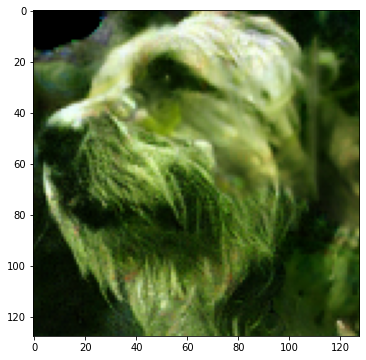

Wall time: 19.4 s


In [26]:
%%time
seed = 1
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(seed)
import os
os.environ['PYTHONHASHSEED'] = str(seed)

params = {
    "distance": "l2",
    "constraint": "targeted",
    "xi_c": {'scheduler': 'SchedulerPower', 'params': {'initial': 1, 'power': -0.5}},
    "xi_o": {'scheduler': 'SchedulerConstant', 'params': {'alpha': 1}},
    "grad_norm_c": 'l2',
    "grad_norm_o": 'l2',
    'threshold': 0.0001,
    "iters": 150,
}
method = ProjectionMethod2(**params)

device = 'cuda'

z0 = z_all[[-1]].to(device)
z_init = z_broccoli[[[-2]]].to(device)

generator = ImagenetBigBiGAN(4, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(generator.decode(z))

v0 = generator.encode(z0)
v_init = generator.encode(z_init)
target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)
v_per = method(x0=v0, x_init=v_init, classifier=combined, generator=generator, target=target_labels)

grid_plot(generator.decode(v_per))

Loaded pretrained weights for efficientnet-b0
Invalid step... correcting
Invalid step... correcting
Invalid step... correcting


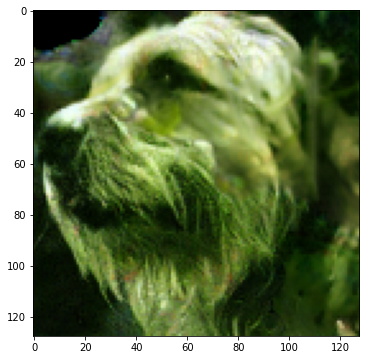

Wall time: 27.3 s


In [29]:
%%time
seed = 1
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(seed)
import os
os.environ['PYTHONHASHSEED'] = str(seed)

params = {
    "distance": "l2",
    "constraint": "targeted",
    "xi_c": {'scheduler': 'SchedulerPower', 'params': {'initial': 1, 'power': -0.5}},
    "xi_o": {'scheduler': 'SchedulerConstant', 'params': {'alpha': 1}},
    "grad_norm_c": 'l2',
    "grad_norm_o": 'l2',
    'threshold': 0.0001,
    "iters": 150,
}
method = ProjectionMethod2(**params)

device = 'cuda'

z0 = z_all[[-1]].to(device)
z_init = z_broccoli[[[-2]]].to(device)

generator = ImagenetBigBiGAN(4, device)
classifier = EfficientNetClassifier(device)
combined = lambda z: classifier(generator.decode(z))

v0 = generator.encode(z0)
v_init = generator.encode(z_init)
target_labels = torch.tensor([937], dtype=torch.int64, device=v0.device)
v_per = method(x0=v0, x_init=v_init, classifier=combined, generator=generator, target=target_labels)

grid_plot(generator.decode(v_per))

# Foolbox attack imagenet picture

In [23]:
import foolbox as fb
import eagerpy as ep
from foolbox import PyTorchModel, accuracy, samples
from foolbox import Misclassification, TargetedMisclassification

In [24]:
device = 'cuda'
classifier = EfficientNetClassifier(device).eval()
fmodel = fb.PyTorchModel(classifier, bounds=(0, 1))

bgan = ImagenetBigBiGAN(1, 'cpu')
x_data = bgan(z_all).to(device)

y_data = torch.tensor([937], dtype=torch.int64, device=device)

images, = ep.astensors(x_data[[-1]].detach())

Loaded pretrained weights for efficientnet-b0


In [31]:
attack = fb.attacks.L2CarliniWagnerAttack()
crit = TargetedMisclassification(y_data)

_, advs, success = attack(model=fmodel, inputs=images, criterion=crit, epsilons=[1.0])
x_adv = advs[-1].raw

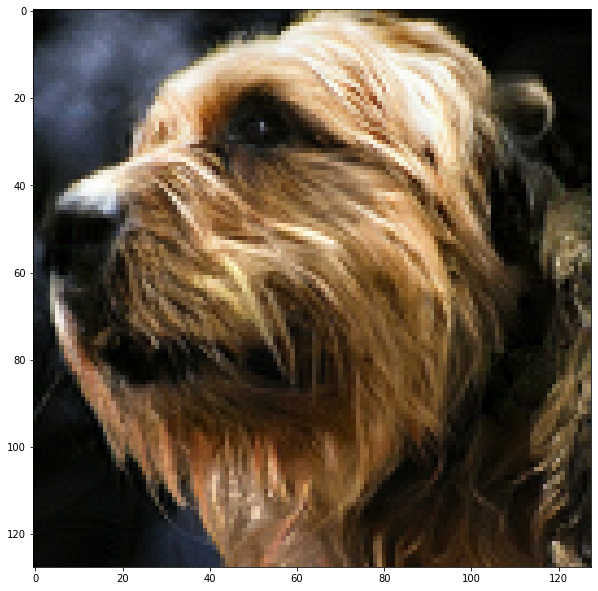

In [32]:
grid_plot(x_adv, nrows=10, figsize=(10, 20))

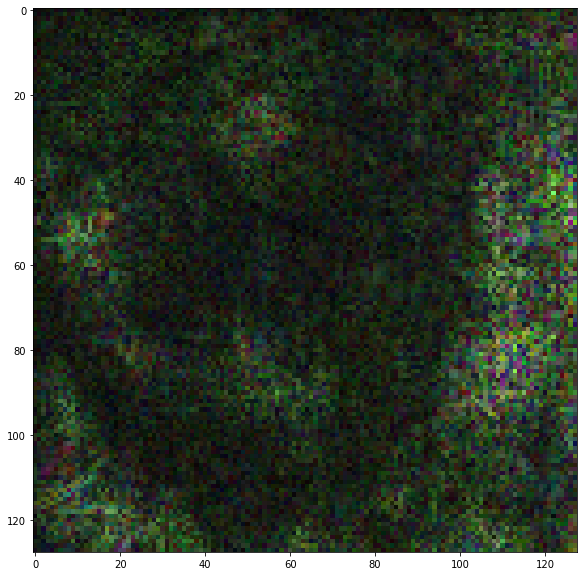

In [40]:
diff = (x_adv - x_data[[-1]]).abs()**(1/2)
grid_plot(diff, nrows=10)